# Amora AI - custom model training

This notebook is the **experimentation counterpart** of `train_amora.ipynb` (which is fixed on MobileNetV2). Here you can:

- **Pick the backbone** from a registry of architectures (ResNet18, MobileNetV2, MobileNetV3, EfficientNet, ResNet50, DenseNet...). Each entry brings its own `preprocess_input`, so the pixel scaling always matches the pre-trained weights. The default is **ResNet18**.
- **Change every hyperparameter in one place** - image size, batch size, learning rates, dropout, head size, per-transformation augmentation probabilities, how many layers to unfreeze in fine-tuning.

The pipeline is the same proven one from the MobileNetV2 notebook: data generators with augmentation, a frozen backbone with a small classification head, two-phase training (head first, then fine-tuning) and a full evaluation with confusion matrix and per-image results.

**Compute device:** the cell right after the imports picks the best available device with priority **METAL > CUDA > CPU** - the Apple Silicon GPU on this Mac (via tensorflow-metal), an NVIDIA GPU elsewhere, and the CPU only as a last resort (with a warning).

In [1]:
import os
import subprocess

import numpy as np
import tensorflow as tf
from tensorflow.keras import applications, layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [ ]:
# Compute device selection, priority: METAL > CUDA > CPU.
# TensorFlow reports both Metal (Apple Silicon, tensorflow-metal plugin) and
# CUDA (NVIDIA) as "GPU" devices; what differs is the build underneath.
# Whichever is found is used automatically by all the training below.
import platform

gpus = tf.config.list_physical_devices("GPU")
for gpu in gpus:
    try:
        # keeps CUDA from grabbing all VRAM up front; harmless no-op on Metal
        tf.config.experimental.set_memory_growth(gpu, True)
    except Exception:
        pass

if gpus and platform.system() == "Darwin":
    DEVICE = "METAL"
elif gpus and tf.test.is_built_with_cuda():
    DEVICE = "CUDA"
elif gpus:
    DEVICE = "GPU"  # some other accelerator plugin
else:
    DEVICE = "CPU"

print("Compute device:", DEVICE + (f" ({gpus[0].name})" if gpus else ""))
if DEVICE == "CPU":
    print("WARNING: no GPU found, training will run on the CPU (slow).")
    print("Apple Silicon: pip install tensorflow-metal | NVIDIA: install a CUDA build of TensorFlow.")

## 1. Configuration

Everything you might want to change lives in the next two cells.

**Model registry** - each entry maps a name to `(constructor, preprocess_input, has_pretrained_weights)`. The `preprocess_input` pairing matters: every family was pre-trained with a specific pixel scaling, and using the wrong one silently degrades the pre-trained weights.

| Name | Size | Notes |
| --- | --- | --- |
| `mobilenet_v2` | ~2.3M params | Light and fast, the browser/TF.js baseline |
| `mobilenet_v3_large` | ~3.0M params | Newer mobile architecture |
| `efficientnet_b0` | ~4.0M params | Strong accuracy/size trade-off |
| `efficientnet_v2_b0` | ~5.9M params | Faster training than v1 |
| `resnet18` | ~11.2M params | Built by hand below; no ImageNet weights, trains from scratch |
| `resnet50_v2` | ~23.5M params | Classic heavyweight reference |
| `densenet121` | ~7.0M params | Dense connections, good with small datasets |

Keras applications has no official ResNet18, so it is implemented by hand in the next cell. Since it has no ImageNet weights, the whole network trains from scratch (the freeze/fine-tune phases only make sense with pre-trained weights, so they are skipped for it).

To add another architecture, just add one entry to the registry.

In [3]:
def build_resnet18(input_shape=(224, 224, 3), include_top=False, weights=None):
    """ResNet18 built by hand (Keras applications has no official ResNet18).

    There are no ImageNet weights for it here, so it always starts with
    random weights and trains from scratch.
    """
    if weights is not None:
        raise ValueError("ResNet18 has no pre-trained weights in this project")

    def basic_block(x, filters, stride=1):
        shortcut = x
        y = layers.Conv2D(filters, 3, strides=stride, padding="same", use_bias=False)(x)
        y = layers.BatchNormalization()(y)
        y = layers.ReLU()(y)
        y = layers.Conv2D(filters, 3, padding="same", use_bias=False)(y)
        y = layers.BatchNormalization()(y)
        # projection shortcut when the shape changes
        if stride != 1 or shortcut.shape[-1] != filters:
            shortcut = layers.Conv2D(filters, 1, strides=stride, use_bias=False)(shortcut)
            shortcut = layers.BatchNormalization()(shortcut)
        y = layers.Add()([y, shortcut])
        return layers.ReLU()(y)

    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, 7, strides=2, padding="same", use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

    # 4 stages of 2 basic blocks each: the classic 18-layer layout
    for filters, first_stride in [(64, 1), (128, 2), (256, 2), (512, 2)]:
        x = basic_block(x, filters, stride=first_stride)
        x = basic_block(x, filters)

    return Model(inputs, x, name="resnet18")


# Model registry: name -> (constructor, preprocess_input, has_pretrained_weights)
MODEL_REGISTRY = {
    "mobilenet_v2": (
        applications.MobileNetV2,
        applications.mobilenet_v2.preprocess_input,
        True,
    ),
    "mobilenet_v3_large": (
        applications.MobileNetV3Large,
        applications.mobilenet_v3.preprocess_input,
        True,
    ),
    "efficientnet_b0": (
        applications.EfficientNetB0,
        applications.efficientnet.preprocess_input,
        True,
    ),
    "efficientnet_v2_b0": (
        applications.EfficientNetV2B0,
        applications.efficientnet_v2.preprocess_input,
        True,
    ),
    "resnet18": (
        build_resnet18,
        applications.resnet_v2.preprocess_input,  # simple [-1, 1] scaling
        False,
    ),
    "resnet50_v2": (
        applications.ResNet50V2,
        applications.resnet_v2.preprocess_input,
        True,
    ),
    "densenet121": (
        applications.DenseNet121,
        applications.densenet.preprocess_input,
        True,
    ),
}

# Pick the backbone here
MODEL_NAME = "resnet18"

assert MODEL_NAME in MODEL_REGISTRY, f"Unknown model: {MODEL_NAME}"
build_base_model, preprocess_input, HAS_PRETRAINED = MODEL_REGISTRY[MODEL_NAME]
print(f"Selected model: {MODEL_NAME} (pre-trained: {HAS_PRETRAINED})")

Selected model: resnet18 (pre-trained: False)


In [4]:
# Data
DATASET_DIR = "dataset"
IMG_SIZE = (224, 224)
BATCH_SIZE = 8
VALIDATION_SPLIT = 0.2

# Augmentation (training only)
# AUG_PROB is the chance (0.0 to 1.0) of each transformation being applied
# to an image; the *_RANGE values control how strong it is when it happens.
AUG_PROB = {
    "rotation": 0.5,
    "zoom": 0.5,
    "width_shift": 0.5,
    "height_shift": 0.5,
    "horizontal_flip": 0.5,
    "brightness": 0.5,
}
ROTATION_RANGE = 20        # degrees
ZOOM_RANGE = 0.3           # 1 +- this factor
WIDTH_SHIFT_RANGE = 0.2    # fraction of the image width
HEIGHT_SHIFT_RANGE = 0.2   # fraction of the image height
BRIGHTNESS_RANGE = [0.7, 1.3]

# Classification head
DROPOUT = 0.3
DENSE_UNITS = 0  # extra Dense layer before the output; 0 disables it

# Phase 1: train the head with the backbone frozen
EPOCHS = 200  # EarlyStopping ends training much earlier
LEARNING_RATE = 1e-4
EARLY_STOP_PATIENCE = 40
REDUCE_LR_PATIENCE = 5
REDUCE_LR_FACTOR = 0.3

# Phase 2: fine-tuning (only used for backbones with pre-trained weights)
FINE_TUNE = True
FINE_TUNE_LAYERS = 30      # how many layers to unfreeze, counted from the end
FINE_TUNE_EPOCHS = 30
FINE_TUNE_LR = 1e-5

# Output
RUN_NAME = f"amora_{MODEL_NAME}"
OUTPUT_DIR = "output"
EXPORT_TFJS = False  # see the export section at the end

## 2. Data and preprocessing

Same scheme as the MobileNetV2 notebook: one folder per class in `dataset/`, augmentation only on the training generator, and the **same** `validation_split` on both generators (Keras splits files by position, so different values would make train and validation overlap).

Two differences from the MobileNetV2 notebook:

- `preprocess_input` comes from the registry, so it always matches the selected backbone.
- Augmentation is applied by a **custom function with per-transformation probabilities**. The stock `ImageDataGenerator` always applies rotation/zoom/shift (only the magnitude is random); here, each transformation first rolls its own dice against `AUG_PROB` and only happens if it wins. With every probability at 0.5, an image has a 50% chance of being rotated, an independent 50% chance of being zoomed, and so on - so some images pass through untouched and others get several transformations at once.

In [5]:
# bare generator used only for its apply_transform method
transformer = ImageDataGenerator()


def augment_and_preprocess(img):
    """Apply each augmentation with its own probability (AUG_PROB),
    then the backbone's preprocess_input.

    Runs on the raw image (pixels 0-255) before any scaling.
    """
    transform = {}
    if np.random.rand() < AUG_PROB["rotation"]:
        transform["theta"] = np.random.uniform(-ROTATION_RANGE, ROTATION_RANGE)
    if np.random.rand() < AUG_PROB["zoom"]:
        zoom = np.random.uniform(1 - ZOOM_RANGE, 1 + ZOOM_RANGE)
        transform["zx"] = transform["zy"] = zoom
    if np.random.rand() < AUG_PROB["height_shift"]:
        transform["tx"] = np.random.uniform(-HEIGHT_SHIFT_RANGE, HEIGHT_SHIFT_RANGE) * img.shape[0]
    if np.random.rand() < AUG_PROB["width_shift"]:
        transform["ty"] = np.random.uniform(-WIDTH_SHIFT_RANGE, WIDTH_SHIFT_RANGE) * img.shape[1]
    if np.random.rand() < AUG_PROB["horizontal_flip"]:
        transform["flip_horizontal"] = True
    if np.random.rand() < AUG_PROB["brightness"]:
        transform["brightness"] = np.random.uniform(*BRIGHTNESS_RANGE)

    if transform:
        img = transformer.apply_transform(img, transform)
    return preprocess_input(img)


train_datagen = ImageDataGenerator(
    preprocessing_function=augment_and_preprocess,
    validation_split=VALIDATION_SPLIT,
)

# validation: no augmentation, same split
val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=VALIDATION_SPLIT,
)

train_gen = train_datagen.flow_from_directory(
    DATASET_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="binary",
    subset="training",
    shuffle=True,
)

val_gen = val_datagen.flow_from_directory(
    DATASET_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="binary",
    subset="validation",
    shuffle=False,
)

print()
print("Classes and indices:")
for cls, idx in train_gen.class_indices.items():
    print(f"  {cls}: {idx}")

counts = np.bincount(train_gen.classes)
print()
print("Distribution in TRAINING:")
for cls, idx in train_gen.class_indices.items():
    print(f"  {cls}: {counts[idx]} images")

Found 2376 images belonging to 2 classes.
Found 593 images belonging to 2 classes.

Classes and indices:
  amora: 0
  not_amora: 1

Distribution in TRAINING:
  amora: 268 images
  not_amora: 2108 images


## 3. Model

Transfer learning with the selected backbone:

- `include_top=False` keeps only the feature extractor.
- With pre-trained weights, the backbone starts **frozen**; only the head learns in phase 1.
- Without pre-trained weights (`resnet18`), freezing random weights would make phase 1 useless, so the **whole network trains from the start**.
- The head: `GlobalAveragePooling2D`, optional `Dense(DENSE_UNITS, relu)`, `Dropout(DROPOUT)` and a `Dense(1, sigmoid)` output.

The sigmoid output is **P(class 1) = P(not_amora)** (Keras orders classes alphabetically: `amora` = 0, `not_amora` = 1). The closer to 0, the more it looks like Amora.

In [6]:
base_model = build_base_model(
    input_shape=(*IMG_SIZE, 3),
    include_top=False,
    weights="imagenet" if HAS_PRETRAINED else None,
)

if HAS_PRETRAINED:
    # phase 1: backbone frozen, only the head learns
    base_model.trainable = False
else:
    # no pre-trained weights: freezing random weights makes no sense,
    # so the whole network trains from scratch
    base_model.trainable = True
    print("No pre-trained weights for this backbone: training from scratch")

x = base_model.output
x = GlobalAveragePooling2D()(x)
if DENSE_UNITS > 0:
    x = Dense(DENSE_UNITS, activation="relu")(x)
x = Dropout(DROPOUT)(x)
output = Dense(1, activation="sigmoid")(x)

model = Model(inputs=base_model.input, outputs=output)

model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)

print(f"Backbone: {MODEL_NAME} ({len(base_model.layers)} layers)")
print(f"Total parameters: {model.count_params():,}")

2026-08-12 00:43:10.336042: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1
2026-08-12 00:43:10.336304: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2026-08-12 00:43:10.336313: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.92 GB
I0000 00:00:1786491790.336463 21095023 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1786491790.336590 21095023 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


No pre-trained weights for this backbone: training from scratch
Backbone: resnet18 (67 layers)
Total parameters: 11,186,625


## 4. Training - phase 1 (head only)

- **`EarlyStopping`** watches `val_loss` and restores the best weights, so a large `EPOCHS` is safe.
- **`ReduceLROnPlateau`** lowers the learning rate when `val_loss` stalls (its patience must be lower than EarlyStopping's).
- **`class_weight`** compensates the class imbalance (~8x more `not_amora` than `amora`), otherwise the model gets rewarded for always guessing the majority class.

In [7]:
early_stop = EarlyStopping(
    monitor="val_loss",
    patience=EARLY_STOP_PATIENCE,
    restore_best_weights=True,
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=REDUCE_LR_FACTOR,
    patience=REDUCE_LR_PATIENCE,
    min_lr=1e-6,
)

callbacks = [early_stop, reduce_lr]

counts = np.bincount(train_gen.classes)
total = counts.sum()
class_weight = {i: total / (len(counts) * c) for i, c in enumerate(counts)}
print("Class weights:", class_weight)

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS,
    callbacks=callbacks,
    class_weight=class_weight,
    verbose=1,
)

Class weights: {0: np.float64(4.432835820895522), 1: np.float64(0.5635673624288425)}
Epoch 1/200


2026-08-12 00:43:13.082848: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


297/297 ━━━━━━━━━━━━━━━━━━━━ 80s 237ms/step - accuracy: 0.6515 - loss: 0.7428 - val_accuracy: 0.1180 - val_loss: 2.2894 - learning_rate: 1.0000e-04
Epoch 2/200
297/297 ━━━━━━━━━━━━━━━━━━━━ 73s 245ms/step - accuracy: 0.7168 - loss: 0.5289 - val_accuracy: 0.6543 - val_loss: 0.6927 - learning_rate: 1.0000e-04
Epoch 3/200
297/297 ━━━━━━━━━━━━━━━━━━━━ 80s 269ms/step - accuracy: 0.7298 - loss: 0.5197 - val_accuracy: 0.6779 - val_loss: 0.7142 - learning_rate: 1.0000e-04
Epoch 4/200
297/297 ━━━━━━━━━━━━━━━━━━━━ 79s 267ms/step - accuracy: 0.7487 - loss: 0.4822 - val_accuracy: 0.7083 - val_loss: 0.7023 - learning_rate: 1.0000e-04
Epoch 5/200
297/297 ━━━━━━━━━━━━━━━━━━━━ 94s 317ms/step - accuracy: 0.7391 - loss: 0.4816 - val_accuracy: 0.6644 - val_loss: 0.6200 - learning_rate: 1.0000e-04
Epoch 6/200
297/297 ━━━━━━━━━━━━━━━━━━━━ 80s 269ms/step - accuracy: 0.7921 - loss: 0.4407 - val_accuracy: 0.8280 - val_loss: 0.3774 - learning_rate: 1.0000e-04
Epoch 7/200
297/297 ━━━━━━━━━━━━━━━━━━━━ 101s 340ms/

## 5. Training - phase 2 (fine-tuning)

Unfreezes the last `FINE_TUNE_LAYERS` layers of the backbone and trains with a much lower learning rate (`FINE_TUNE_LR`). The early layers detect universal features (edges, textures) and stay frozen; the last layers are the ones worth specializing on Amora.

**BatchNormalization layers stay frozen** in every architecture: their stored statistics were calibrated on millions of images, and recalibrating them with a small, imbalanced dataset destabilizes training.

Set `FINE_TUNE = False` in the configuration to skip this phase. It is also skipped automatically for backbones without pre-trained weights (`resnet18`), since the whole network already trained in phase 1.

In [8]:
if not HAS_PRETRAINED:
    history_ft = None
    print("Fine-tuning skipped: this backbone has no pre-trained weights, "
          "the whole network already trained in phase 1")
elif FINE_TUNE:
    base_model.trainable = True
    for layer in base_model.layers[:-FINE_TUNE_LAYERS]:
        layer.trainable = False

    # keep BatchNormalization frozen regardless of position
    for layer in base_model.layers:
        if isinstance(layer, tf.keras.layers.BatchNormalization):
            layer.trainable = False

    model.compile(
        optimizer=Adam(learning_rate=FINE_TUNE_LR),
        loss="binary_crossentropy",
        metrics=["accuracy"],
    )

    history_ft = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=FINE_TUNE_EPOCHS,
        callbacks=callbacks,
        class_weight=class_weight,
        verbose=1,
    )
else:
    history_ft = None
    print("Fine-tuning disabled (FINE_TUNE = False)")

Fine-tuning skipped: this backbone has no pre-trained weights, the whole network already trained in phase 1


## 6. Saving the model

The model is saved under `output/` with the backbone name in the file, so runs with different architectures do not overwrite each other.

In [9]:
os.makedirs(OUTPUT_DIR, exist_ok=True)

model_path = os.path.join(OUTPUT_DIR, f"{RUN_NAME}.h5")
model.save(model_path)
print("Model saved to:", model_path)

Model saved to: output/amora_resnet18.h5


## 7. Results

With imbalanced classes, accuracy alone is misleading. The evaluation below shows:

- training curves (with a dashed line where fine-tuning started),
- the confusion matrix broken into the 4 outcomes,
- **recall** and **precision** for the Amora class,
- the per-image table with every validation error, saved as a CSV named after the run.

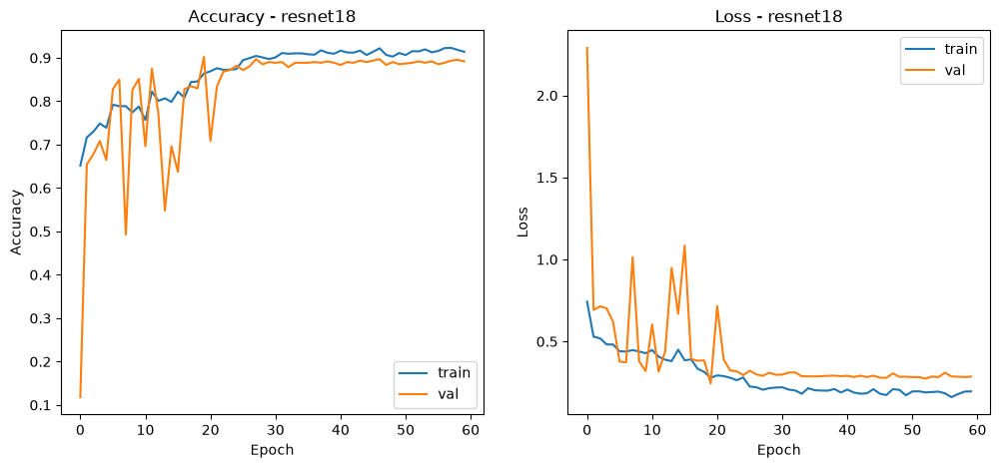

75/75 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step

Per-class result:



,Type,Actual,Predicted,Count
0,Correct Amora,Amora,Amora,55
1,Missed Amora (not recognized),Amora,Not Amora,11
2,Thought it was Amora (but it was not),Not Amora,Amora,47
3,Correct Not Amora,Not Amora,Not Amora,480



Amora recognition (recall): 83.33%
Precision when it says Amora: 53.92%

Full CSV: output/amora_resnet18_results_per_image.csv (593 images)

58 errors out of 593 validation images (9.8%)



,file,actual,predicted,prob_amora,correct
44,amora/amora_0045.jpg,amora,not_amora,0.000,False
10,amora/amora_0011.jpg,amora,not_amora,0.002,False
292,not_amora/not_amora_0227.jpg,not_amora,amora,0.981,False
33,amora/amora_0034.jpg,amora,not_amora,0.034,False
289,not_amora/not_amora_0224.jpg,not_amora,amora,0.964,False
290,not_amora/not_amora_0225.jpg,not_amora,amora,0.963,False
412,not_amora/not_amora_0347.jpg,not_amora,amora,0.953,False
283,not_amora/not_amora_0218.jpg,not_amora,amora,0.917,False
68,not_amora/not_amora_0003.jpg,not_amora,amora,0.898,False
409,not_amora/not_amora_0344.jpg,not_amora,amora,0.896,False


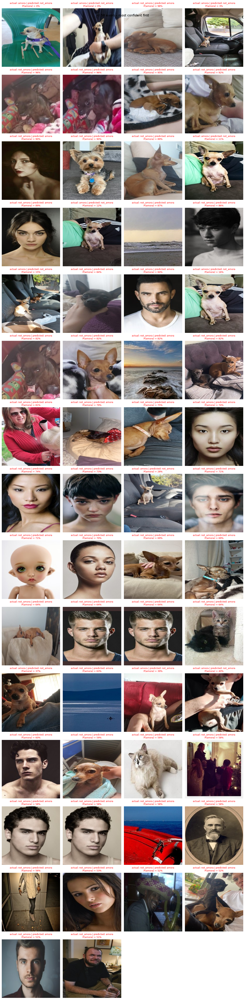

In [10]:
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
from sklearn.metrics import confusion_matrix

# merge the histories of the two phases
hist = {}
histories = [history] + ([history_ft] if history_ft else [])
for h in histories:
    for k, v in h.history.items():
        hist.setdefault(k, []).extend(v)

ft_start = len(history.history["loss"])

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(hist["accuracy"], label="train")
plt.plot(hist["val_accuracy"], label="val")
if history_ft:
    plt.axvline(ft_start, color="gray", linestyle="--", label="fine-tuning start")
plt.title(f"Accuracy - {MODEL_NAME}")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist["loss"], label="train")
plt.plot(hist["val_loss"], label="val")
if history_ft:
    plt.axvline(ft_start, color="gray", linestyle="--", label="fine-tuning start")
plt.title(f"Loss - {MODEL_NAME}")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.show()

# prediction on validation
val_gen.reset()
y_prob = model.predict(val_gen)
y_pred = (y_prob > 0.5).astype(int).ravel()
y_true = val_gen.classes

# confusion matrix (0 = amora)
cm = confusion_matrix(y_true, y_pred)
tp = cm[0, 0]  # correctly identified Amora
fn = cm[0, 1]  # was Amora, predicted Not Amora
fp = cm[1, 0]  # was Not Amora, predicted Amora
tn = cm[1, 1]  # correctly identified Not Amora

summary_table = pd.DataFrame({
    "Type": [
        "Correct Amora",
        "Missed Amora (not recognized)",
        "Thought it was Amora (but it was not)",
        "Correct Not Amora",
    ],
    "Actual": ["Amora", "Amora", "Not Amora", "Not Amora"],
    "Predicted": ["Amora", "Not Amora", "Amora", "Not Amora"],
    "Count": [tp, fn, fp, tn],
})

print("\nPer-class result:\n")
display(summary_table)

recall_amora = tp / (tp + fn)
precision_amora = tp / (tp + fp) if (tp + fp) > 0 else 0.0

print(f"\nAmora recognition (recall): {recall_amora:.2%}")
print(f"Precision when it says Amora: {precision_amora:.2%}")

# per-image table (the sigmoid outputs P(not_amora); invert to get P(amora))
prob_amora = 1.0 - y_prob.ravel()

results = pd.DataFrame({
    "file": val_gen.filenames,
    "actual": ["amora" if c == 0 else "not_amora" for c in y_true],
    "predicted": ["amora" if c == 0 else "not_amora" for c in y_pred],
    "prob_amora": prob_amora.round(3),
})
results["correct"] = results["actual"] == results["predicted"]

csv_path = os.path.join(OUTPUT_DIR, f"{RUN_NAME}_results_per_image.csv")
results.to_csv(csv_path, index=False)
print(f"\nFull CSV: {csv_path} ({len(results)} images)")

errors = results[~results["correct"]].copy()
errors["error_confidence"] = np.where(
    errors["predicted"] == "amora", errors["prob_amora"], 1 - errors["prob_amora"]
)
errors = errors.sort_values("error_confidence", ascending=False)

print(f"\n{len(errors)} errors out of {len(results)} validation images "
      f"({len(errors) / len(results):.1%})\n")
with pd.option_context("display.max_rows", None):
    display(errors.drop(columns="error_confidence"))


def image_grid(df, title, max_imgs=None):
    """Show the images of a results subset, with label and probability."""
    if len(df) == 0:
        print(f"{title}: no images")
        return
    if max_imgs is not None:
        df = df.head(max_imgs)
    cols = 4
    rows = int(np.ceil(len(df) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(14, 3.8 * rows))
    axes = np.atleast_1d(axes).ravel()
    for ax in axes[len(df):]:
        ax.axis("off")
    for ax, (_, r) in zip(axes, df.iterrows()):
        ax.imshow(Image.open(os.path.join(DATASET_DIR, r["file"])))
        color = "green" if r["correct"] else "red"
        ax.set_title(
            f"actual: {r['actual']} | predicted: {r['predicted']}\nP(amora) = {r['prob_amora']:.0%}",
            fontsize=9, color=color,
        )
        ax.axis("off")
    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    plt.show()


image_grid(errors, f"All {len(errors)} errors - most confident first")

## 8. Optional: export to TensorFlow.js

The frontend loads the model with `tf.loadLayersModel`, and the conversion pipeline (`tensorflowjs_converter` + `fix_tfjs_keras3.py`) was written and tested for **MobileNetV2**. Other architectures may need extra layer-name fixes, and the heavier ones are a poor fit for the browser anyway.

Set `EXPORT_TFJS = True` in the configuration to try the export for the selected model.

In [ ]:
if EXPORT_TFJS:
    tfjs_output_path = os.path.join(OUTPUT_DIR, f"{RUN_NAME}_tfjs")

    # The converter runs in its own venv (.venv-tfjs, Python 3.12) because
    # the tensorflowjs package doesn't install on Python 3.13.
    subprocess.run([
        ".venv-tfjs/bin/tensorflowjs_converter",
        "--input_format=keras",
        model_path,
        tfjs_output_path,
    ], check=True)

    # Translate the Keras 3 model.json to the Keras 2 format that the
    # browser's tf.loadLayersModel understands (tested with MobileNetV2)
    from fix_tfjs_keras3 import fix_model_json
    fix_model_json(os.path.join(tfjs_output_path, "model.json"))

    print("Model converted to TensorFlow.js at:", tfjs_output_path)
else:
    print("TF.js export disabled (EXPORT_TFJS = False)")

TF.js export disabled (EXPORT_TFJS = False)
